In [1]:
import os
import sys
import yaml
import matplotlib.pyplot as plt
import numpy as np
import torch
import random
import glob
import rasterio
from PIL import Image
from matplotlib.colors import ListedColormap

In [2]:
if os.getcwd().endswith('notebooks'):
    os.chdir('..')
sys.path.append(os.getcwd())

In [3]:
from src.experiments.train_unet import SegmentationExperiment
from src.utils.rasterize import rasterize_spacenet8

In [4]:
with open("config.yaml", "r") as f:
        config = yaml.safe_load(f)

In [5]:
config["segmentation"]["data"]["train_dir"]

'data/SpaceNet8/Louisiana-East_Training_Public'

In [6]:
BASE_DIR = config["segmentation"]["data"]["train_dir"]

In [13]:
config["segmentation"]["data"]

{'train_dir': 'data/SpaceNet8/Louisiana-East_Training_Public',
 'train_mapping': 'data/SpaceNet8/Louisiana-East_Training_Public/Louisiana-East_Training_Public_label_image_mapping.csv',
 'train_masks': 'data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass',
 'train_img_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/PRE-event',
 'train_annotations_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/annotations',
 'test_dir': 'data/SpaceNet8/Louisiana-West_Test_Publics',
 'test_mapping': 'data/SpaceNet8/Louisiana-West_Test_Public/Louisiana-West_Test_Public_label_image_mapping.csv',
 'test_masks': 'data/SpaceNet8/Louisiana-West_Test_Public/masks_multiclass',
 'test_img_dir': 'data/SpaceNet8/Louisiana-West_Test_Publics/PRE-event',
 'mask_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/masks_generated'}

In [ ]:
rasterize_spacenet8(
    csv_path=config["segmentation"]["data"]["train_mapping"],
    output_mask_dir=config["segmentation"]["data"]["train_masks"],
    img_dir=config["segmentation"]["data"]["train_img_dir"],
    annotations_dir=config["segmentation"]["data"]["train_annotations_dir"]
)

Rasterizing:   0%|          | 0/599 [00:00<?, ?it/s]

Rasterizing: 100%|██████████| 599/599 [00:43<00:00, 13.76it/s]

Success: Masks saved in data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass.


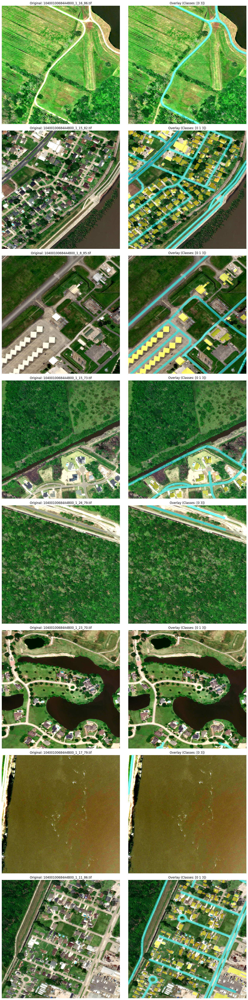

In [ ]:
def debug_overlay_grid(mask_dir, img_dir, num_samples=4):
    all_masks = glob.glob(os.path.join(mask_dir, "*.png"))
    samples = random.sample(all_masks, min(num_samples, len(all_masks)))
    
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 7 * num_samples))
    
    # 0: transparent, 1: Jaune (Bat), 2: Rouge (Bat inondé), 3: Cyan (Route), 4: Magenta (Route inondée)
    colors = ['black', 'yellow', 'red', 'cyan', 'magenta']
    cmap = ListedColormap(colors)

    for i, mask_path in enumerate(samples):
        # Match the image
        img_name = os.path.basename(mask_path).replace('_mask.png', '.tif')
        img_path = os.path.join(img_dir, img_name)
        
        if not os.path.exists(img_path):
            print(f"Image manquante : {img_path}")
            continue

        # Read .tif image
        with rasterio.open(img_path) as src:
            img = src.read([1, 2, 3]).transpose(1, 2, 0)
            # We remove extreme percentile to lighten the image
            p2, p98 = np.percentile(img, (2, 98))
            img = np.clip((img - p2) / (p98 - p2), 0, 1)
        
        # Mask
        mask = np.array(Image.open(mask_path))
        
        # Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f"Original: {img_name}")
        axes[i, 0].axis('off')
        
        # Overlay
        axes[i, 1].imshow(img)
        
        mask_overlay = np.ma.masked_where(mask == 0, mask)
        axes[i, 1].imshow(mask_overlay, cmap=cmap, alpha=0.5, vmin=0, vmax=4)
        axes[i, 1].set_title(f"Overlay (Classes: {np.unique(mask)})")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

MASK_DIR = "data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass"
IMG_DIR = "data/SpaceNet8/Louisiana-East_Training_Public/PRE-event"

debug_overlay_grid(MASK_DIR, IMG_DIR, num_samples=8)

In [7]:
exp = SegmentationExperiment(config_path="config.yaml")

In [8]:
exp.run()

--- Starting Segmentation Training on cpu ---


Epoch 1:   0%|          | 0/160 [00:00<?, ?batch/s]


[DEBUG] Epoch 1 - Premier Batch:
   -> Images shape: torch.Size([3, 3, 256, 256])
   -> Masks shape:  torch.Size([3, 256, 256])


Epoch 1: 100%|██████████| 160/160 [12:33<00:00,  4.71s/batch, loss=0.641]



[Validation] Loss: 0.6470 | Acc: 0.2107 | Prec: 0.2831 | F1: 0.2118
Epoch 1: Train Loss: 0.8864 | Val Loss: 0.6470 | Val F1: 0.2118


KeyError: 'model_path'

In [9]:
def visualize_prediction(model, dataset, device):
    model.eval()
    img, mask = dataset[0] # Prends la première image
    img_input = img.unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(img_input)
        pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(mask)
    plt.title("Vrai Masque")
    plt.subplot(1, 2, 2)
    plt.imshow(pred)
    plt.title("Prédiction du Modèle")
    plt.show()

visualize_prediction(exp.model, exp.prepare_data(mode='train').dataset, exp.device)

AttributeError: 'tuple' object has no attribute 'dataset'